# Races Dataset Understanding

### Data Mining Project 2024/25

Authors: Nicola Emmolo, Simone Marzeddu, Jacopo Raffi

In this notebook, we will analyze and understand the behavior and patterns of races in a deeper way, after the first analysis about the syntactic and semantic correctness.

By the end of this notebook, we aim to gain a comprehensive understanding of races' activities and make data-driven decisions.

In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
import pandas as pd
import numpy as np
import math

import seaborn as sb
import matplotlib.pyplot as plt

import os
import sys
sys.path.append(os.path.abspath('../src'))

from utils import *
from unidecode import unidecode
from matplotlib.ticker import MaxNLocator

import warnings
warnings.simplefilter(action='ignore', category=DeprecationWarning)


In [9]:
# Create union of two datasets, merging them considering the url of the cyclist
dataset_cyclists = pd.read_csv("../data/cyclists.csv")
dataset_races = pd.read_csv("../data/races.csv")
complete_data = pd.merge(dataset_races, dataset_cyclists, left_on='cyclist', right_on='_url', how='inner')

# Modify name column of the cyclist url in 'cyclist_url', and name column of the race url in 'race_url'
complete_data = complete_data.rename(columns={'_url_y': 'cyclist_url', '_url_x': 'race_url'})
# Modify name column of the cyclist name in 'cyclist_name', and name column of the race name in 'race_name'
complete_data = complete_data.rename(columns={'name_y': 'cyclist_name', 'name_x': 'race_name'})

# Take only the year-month-day part of 'date' (delete the time)
complete_data['date'] = complete_data['date'].str.split(' ').str[0]

cyclists = pd.read_csv("../data/cyclists.csv")

In [10]:
dataset = pd.read_csv("../data/races.csv")
dataset.head(n=5)

,_url,name,points,uci_points,length,climb_total,profile,startlist_quality,average_temperature,date,position,cyclist,cyclist_age,is_tarmac,is_cobbled,is_gravel,cyclist_team,delta
0,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,0,sean-kelly,22.0,True,False,False,vini-ricordi-pinarello-sidermec-1986,0.0
1,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,1,gerrie-knetemann,27.0,True,False,False,norway-1987,0.0
2,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,2,rene-bittinger,24.0,True,False,False,NaN,0.0
3,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,3,joseph-bruyere,30.0,True,False,False,navigare-blue-storm-1993,0.0
4,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,4,sven-ake-nilsson,27.0,True,False,False,spain-1991,0.0


In [11]:
dataset.describe()

,points,uci_points,length,climb_total,profile,startlist_quality,average_temperature,position,cyclist_age,delta
count,589388.000000,251086.000000,589865.000000,442820.000000,441671.000000,589865.000000,29933.000000,589865.000000,589752.000000,589865.000000
mean,89.221635,74.601547,166776.180584,2330.469215,2.611611,1101.161178,21.731768,74.219491,28.486208,418.292794
std,54.435330,100.947962,64545.605664,1375.710722,1.491741,380.586928,5.884761,48.404023,3.855631,842.961596
min,18.000000,6.000000,1000.000000,2.000000,1.000000,115.000000,10.000000,0.000000,13.000000,-6906.000000
25%,50.000000,16.000000,152500.000000,1309.000000,1.000000,844.000000,17.000000,32.000000,26.000000,10.000000
50%,80.000000,60.000000,178200.000000,2255.000000,2.000000,988.000000,22.000000,70.000000,28.000000,156.000000
75%,100.000000,100.000000,203500.000000,3273.000000,4.000000,1309.000000,26.000000,112.000000,31.000000,624.000000
max,350.000000,800.000000,338000.000000,6974.000000,5.000000,2047.000000,36.000000,209.000000,56.000000,61547.000000


In [12]:
print(f'Number of duplicates: {len(dataset)-len(dataset.drop_duplicates())}')

Number of duplicates: 0


## Type Correctness
In this initial section we check the correctness of the data types

In [13]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 589865 entries, 0 to 589864
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   _url                 589865 non-null  object 
 1   name                 589865 non-null  object 
 2   points               589388 non-null  float64
 3   uci_points           251086 non-null  float64
 4   length               589865 non-null  float64
 5   climb_total          442820 non-null  float64
 6   profile              441671 non-null  float64
 7   startlist_quality    589865 non-null  int64  
 8   average_temperature  29933 non-null   float64
 9   date                 589865 non-null  object 
 10  position             589865 non-null  int64  
 11  cyclist              589865 non-null  object 
 12  cyclist_age          589752 non-null  float64
 13  is_tarmac            589865 non-null  bool   
 14  is_cobbled           589865 non-null  bool   
 15  is_gravel        

Since the "date" attribute information contained time details in hourly format, and since these constitute more of a source of noise for our analyses, we decided to remove this specificity, maintaining a "year-month-day" format.

In [14]:
dataset['date'] = dataset['date'].str.split(' ').str[0]
dataset['date'] = pd.to_datetime(dataset['date'], format='%Y-%m-%d')

The climb total value is recorded in the dataset as a float but does not have decimal digits. Therefore, without further analysis, we decided to change its type to integer.

In [15]:
# climb_total è logicamente un intero
dataset['climb_total'] = dataset[dataset['climb_total'].notnull()]['climb_total'].astype(int)

The attribute "profile" is clearly categorical. The only discrepancy with the data overview provided with the project is the presence of one additional value (from 4 to 5 categories). However, at this stage, we do not consider this discrepancy to be harmful but rather an opportunity to examine the race profiles with finer granularity.

In [16]:
len(dataset[dataset['profile'].notnull()]['profile'].unique())

5

In [17]:
# 'profile' is clearly a categorical attribute, so we change its type
dataset['profile'] = dataset['profile'].astype('category')

The "position" attribute represents the position of a cyclist in the ranking of a specific race. This value is represented as an integer within the dataset, and we discussed whether it could be represented as categorical. Noting that for different races, the total number of positions and consequently their relative value in the ranking are different, we preferred to consider this value exclusively as an integer. Otherwise, we would have the same category value with different shades of meaning depending on the competition, which seemed inappropriate for this type of data.

Cyclist ages are considered integers

In [18]:
dataset['cyclist_age'] = dataset[dataset['cyclist_age'].notnull()]['cyclist_age'].astype(int)

## Features Understanding

The current section of the document will delve further into the examination of feature values.

In [19]:
percent_missing = dataset.isnull().sum() * 100 / len(dataset) # compute the percentage of missing values
missing_value_df = pd.DataFrame({'column_name': dataset.columns,
                                 'percent_missing': percent_missing})

missing_value_df['percent_missing']

_url                    0.000000
name                    0.000000
points                  0.080866
uci_points             57.433311
length                  0.000000
climb_total            24.928585
profile                25.123376
startlist_quality       0.000000
average_temperature    94.925449
date                    0.000000
position                0.000000
cyclist                 0.000000
cyclist_age             0.019157
is_tarmac               0.000000
is_cobbled              0.000000
is_gravel               0.000000
cyclist_team           26.982615
delta                   0.000000
Name: percent_missing, dtype: float64

We can observe that about 95% of the values are missing in the "average_temperature" attribute. Our assumption is that it is impossible to use this value correctly or to correct it with imputation, and therefore we prefer to remove it immediately to reduce the dimensionality of the dataset.

In [20]:
dataset = dataset.drop(columns=['average_temperature'])

With the same analysis just mentioned, we found that the percentage of missing values in the "uci_points" attribute is particularly high (about 57%). However, from our external research, this category of points was invented after the 2000s, so the lack of these values could be attributed to the presence of records dating back to periods before their implementation. Therefore, we decided to keep these values despite being absent in most records to perform targeted analyses.

About the points value, we see that it's missing in just few rows, and we aim to easily impute them considering the points in the same races near in time.


The attributes "is_cobbled" and "is_gravel" (as already seen in the notebook races_possible_errors.ipynb) have only one value (False) and therefore are not relevant as they do not add useful information to our analyses. We have thus removed the two columns and renamed the column "is_tarmac" to "mostly_tarmac," integrating the opinion of an external expert who stated that the type of terrain "tarmac" is always present (at least partially) in all tracks, with some of these predominantly featuring this type of terrain.

In [21]:
dataset = dataset.drop(columns=['is_cobbled', 'is_gravel'])
dataset = dataset.rename(columns={'is_tarmac': 'mostly_tarmac'})

### `url` attribute

In [22]:
url_counts = dataset['_url'].value_counts()

# From url_counts, get the urls where the number of occurrence is less than 5
print(url_counts[url_counts < 5])

_url
tour-de-romandie/1989/stage-4        4
tour-de-suisse/1979/stage-7          4
tour-de-suisse/1979/stage-6          4
tour-de-romandie/1981/stage-2        4
tour-de-suisse/1970/stage-3          4
tour-de-romandie/1981/stage-1        4
tour-de-suisse/1970/stage-5          4
tour-de-suisse/1975/stage-8          4
tour-de-suisse/1976/stage-8          4
tour-de-suisse/1985/stage-5          4
tour-de-suisse/1979/stage-1          4
tour-de-suisse/1979/stage-3b         4
dwars-door-vlaanderen/1979/result    3
tour-de-suisse/1979/stage-4          3
volta-a-catalunya/1970/stage-4       3
tour-de-romandie/1981/prologue       3
il-lombardia/1973/result             3
tour-de-romandie/1981/stage-5a       3
il-lombardia/1974/result             2
tour-de-suisse/1979/stage-5          2
tour-de-suisse/1972/stage-8a         1
il-lombardia/1972/result             1
giro-d-italia/2001/stage-14          1
tour-de-suisse/1972/stage-2          1
tour-de-suisse/1972/stage-7          1
tour-de-suisse/1972/

We see that there are some races where there are few participants

In [23]:
tmp_df = pd.DataFrame({
        'name': dataset['name'],
        'year': dataset['date'].dt.year,
        '_url': dataset['_url']
})

result = tmp_df.groupby(['name', 'year'])['_url'].nunique().reset_index()
pivot_result = result.pivot(index='name', columns='year', values='_url')
pivot_result['same_stages_num'] = pivot_result.nunique(axis=1) == 1
pivot_result

year,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,same_stages_num
name,,,,,,,,,,,,,,,,,,,,,
Amstel Gold Race,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,1.0,True
Clasica Ciclista San Sebastian,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,True
Clásica Ciclista San Sebastian,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,True
Clásica Ciclista San Sebastián,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,True
Clásica San Sebastián,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vuelta Ciclista al País Vasco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
Vuelta a España,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,20.0,20.0,20.0,NaN,NaN,NaN,NaN,NaN,NaN,False
Vuelta al País Vasco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,True


We have verified the variation of URLs over the years. We discovered that in our dataset, the same competition in different years presents a different number of stages. This can be caused by two factors:
* The number of stages has changed over the years;
* Our dataset is incomplete.

By checking online, we have confirmed the two factors mentioned above.

### `name` attribute

Ensuring the absence of NaN values, we analyzed the race names in the dataset and found that different names were recorded for the same race. After conducting online researches to obtain the official names, we replaced all variant occurrences with the canonical names.

Online research was conducted to compare multiple sources, aiming to enhance the accuracy of the information. While this approach is not scientifically rigorous, it serves as a practical, exploratory method akin to consulting an expert, similar to what a professional data miner might do.

Noticing the term "ME" in some names, we conducted further specific research, discovering that this terminology refers to "Men Elite," which could distinguish two different classes for the same race. We then verified if both the ME and non-ME versions of the same competition could appear in the same year, finding that this never happens. With this reasoning, we determined that the ME nomenclature of a competition is just another synonym for the canonical name of the same, with which we replaced every occurrence.

In [24]:
dataset[dataset['name'].notnull()].groupby(by='name', observed=True)['name'].value_counts()

name
Amstel Gold Race                       4349
Clasica Ciclista San Sebastian         3884
Clásica Ciclista San Sebastian           84
Clásica Ciclista San Sebastián          236
Clásica San Sebastián                    52
                                      ...  
Vuelta Ciclista al País Vasco          6529
Vuelta a España                       89222
Vuelta al País Vasco                   7206
World Championships - Road Race        1611
World Championships ME - Road Race     2306
Name: count, Length: 61, dtype: int64

In [25]:
len(dataset['name'].unique())

61

In [26]:
dataset['name'] = dataset['name'].apply(unidecode)
dataset['name'] = dataset['name'].replace(to_replace={'Clasica Ciclista San Sebastian':'Clasica San Sebastian',
                                                      'Donostia San Sebastian Klasikoa':'Clasica San Sebastian',
                                                         'Criterium du Dauphine Libere':'Criterium du Dauphine',
                                                         'Gran Camino':'O Gran Camino',
                                                         'La Vuelta ciclista a Espana':'Vuelta a Espana',
                                                         'Dwars door Belgie / A travers la Belgique':'Dwars door Vlaanderen',
                                                         'Dwars door Vlaanderen - A travers la Flandre ME':'Dwars door Vlaanderen ME',
                                                         'Dwars door Vlaanderen / A travers la Flandre':'Dwars door Vlaanderen',
                                                         'Dwars door Vlaanderen / A travers la Flandre ME':'Dwars door Vlaanderen ME',
                                                         'E3 BinckBank Classic':'E3 Saxo Bank Classic',
                                                         'E3 Harelbeke':'E3 Saxo Bank Classic',
                                                         'E3 Prijs Vlaanderen':'E3 Saxo Bank Classic',
                                                         'E3 Prijs Vlaanderen - Harelbeke':'E3 Saxo Bank Classic',
                                                         'E3 Saxo Classic':'E3 Saxo Bank Classic',
                                                         'E3-Prijs Harelbeke':'E3 Saxo Bank Classic',
                                                         'Record Bank E3 Harelbeke':'E3 Saxo Bank Classic',
                                                         'Giro di Lombardia':'Il Lombardia',
                                                         'Liege - Bastogne - Liege':'Liege-Bastogne-Liege',
                                                         'Monte Paschi Eroica':'Strade Bianche',
                                                         'Montepaschi Strade Bianche - Eroica Toscana':'Strade Bianche',
                                                         'Omloop Het Volk':'Omloop Nieuwsblad',
                                                         'Omloop Het Nieuwsblad ME':'Omloop Nieuwsblad ME',
                                                         'Omloop Het Volk ME':'Omloop Nieuwsblad ME',
                                                         'Paris - Roubaix':'Paris-Roubaix',
                                                         'Ronde van Vlaanderen - Tour des Flandres ME':'Ronde van Vlaanderen ME',
                                                         'Ronde van Vlaanderen / Tour des Flandres':'Ronde van Vlaanderen',
                                                         'Ronde van Vlaanderen / Tour des Flandres ME':'Ronde van Vlaanderen ME',
                                                         'Volta a Catalunya':'Volta Ciclista a Catalunya',
                                                         'Vuelta Ciclista al Pais Vasco':'Vuelta al Pais Vasco',
                                                         })

In [27]:
len(dataset['name'].unique())

32

In [28]:
tmp_df = pd.DataFrame({
    'name': dataset['name'],
    'year': dataset['date'].dt.year,
    'general_name': dataset['name'].apply(lambda x: x.split('ME')[0].strip()),
})

n_name = tmp_df.groupby(by=['general_name', 'year'], observed=True)['name'].nunique()

n_name_gt1 = n_name[n_name > 1]
round(len(n_name_gt1) / len(n_name) * 100, 2)

0.0

In [29]:
dataset['name'] = dataset['name'].replace(to_replace={
                                                         'Dwars door Vlaanderen ME':'Dwars door Vlaanderen',
                                                         'Omloop Nieuwsblad ME':'Omloop Nieuwsblad',
                                                         'Ronde van Vlaanderen ME':'Ronde van Vlaanderen',
                                                         'World Championships ME - Road Race':'World Championships - Road Race'
                                                         })

### `points` attribute

We have found that the "points" attribute does not refer (contrary to what might be inferred) to the points earned by a given cyclist in a given stage of a given race, but rather to a predefined value depending on the race, stage, and year in which the competition was held.

In [30]:
dataset.groupby('name')['points'].nunique()

name
Amstel Gold Race                   1
Clasica San Sebastian              2
Criterium du Dauphine              3
Dwars door Vlaanderen              3
E3 Saxo Bank Classic               2
Giro d'Italia                      3
Grand Prix Cycliste de Montreal    1
Grand Prix Cycliste de Quebec      1
Il Lombardia                       1
Itzulia Basque Country             1
La Fleche Wallonne                 1
Liege-Bastogne-Liege               1
Milano-Sanremo                     1
O Gran Camino                      1
Omloop Nieuwsblad                  2
Paris - Nice                       3
Paris-Roubaix                      1
Ronde van Vlaanderen               1
Strade Bianche                     3
Tirreno-Adriatico                  2
Tour de France                     3
Tour de Romandie                   1
Tour de Suisse                     2
UAE Tour                           1
Volta Ciclista a Catalunya         1
Vuelta a Espana                    2
Vuelta al Pais Vasco             

In [31]:
tmp_df = tmp_df = pd.DataFrame({
    '_url': dataset['_url'],
    'name': dataset['name'],
    'year': dataset['date'].dt.year,
    'points': dataset['points'],
    'uci_points': dataset['uci_points'],
    'stage': dataset['_url'].str.split('/', expand=True)[2]
})

n_points = tmp_df.groupby(['year', 'name'])['points'].nunique()
n_points = n_points[n_points > 1]
n_points

year  name                 
1999  Tour de France           2
2000  Tour de France           2
2001  Tour de France           2
2002  Giro d'Italia            2
      Tour de France           2
2003  Tour de France           2
2004  Tour de France           2
      Vuelta a Espana          2
2005  Criterium du Dauphine    2
      Giro d'Italia            2
      Tour de France           3
      Tour de Suisse           2
      Vuelta a Espana          2
2006  Criterium du Dauphine    3
      Giro d'Italia            2
      Tirreno-Adriatico        2
      Tour de Suisse           2
2008  Paris - Nice             2
      Tirreno-Adriatico        2
2009  Giro d'Italia            3
Name: points, dtype: int64

The above analysis reveals that knowing the year in which the competition took place and the name of the competition does not allow us to determine a unique score for all records related to that competition-year pair. In the next analysis, we will then try to distinguish by "_url", an attribute that should gather information on the name and year of the competition, but distinguishing for the various stages of the same.

In [32]:
n_points = tmp_df.groupby(['name', '_url'])['points'].nunique()
n_points = n_points[n_points > 1]
n_points

Series([], Name: points, dtype: int64)

We confirmed the initial hypothesis that each stage of each race has a unique score associated with it in our dataset. This peculiarity confirms that the score is not a value relative to the finishing position in the competition nor a value that we could directly associate with the cyclists. However, it might be interesting in the future to perform analyses regarding the correlation between cyclists and scores to discover unexpected relationships (for example, we might find that the most prestigious races that give more points are attended by the most prestigious cyclists).

In [33]:
unique_data = tmp_df.drop_duplicates(subset=['_url', 'points']) # unique data based on '_url' and 'points'

# Get races where 'points' is null
invalid_races = unique_data[unique_data['points'].isnull()]
print("Number of races where we have null points: ", len(invalid_races))
for url, name, year in invalid_races[['_url', 'name', 'year']].values:
    print(f"Missing points for {url}, race {name} in {year}")

Number of races where we have null points:  4
Missing points for vuelta-a-espana/1994/stage-5, race Vuelta a Espana in 1994
Missing points for tour-de-france/1986/stage-19, race Tour de France in 1986
Missing points for tour-de-france/1988/prologue, race Tour de France in 1988
Missing points for tour-de-france/2019/stage-19, race Tour de France in 2019


Here we note that from all the null values, they are just 4 stages with null points value, so we just have to impute 4 values.

### `uci_points` attribute

In [34]:
dataset.groupby('name')['uci_points'].nunique()

name
Amstel Gold Race                   1
Clasica San Sebastian              1
Criterium du Dauphine              2
Dwars door Vlaanderen              2
E3 Saxo Bank Classic               1
Giro d'Italia                      3
Grand Prix Cycliste de Montreal    1
Grand Prix Cycliste de Quebec      2
Il Lombardia                       1
Itzulia Basque Country             1
La Fleche Wallonne                 1
Liege-Bastogne-Liege               2
Milano-Sanremo                     2
O Gran Camino                      1
Omloop Nieuwsblad                  2
Paris - Nice                       2
Paris-Roubaix                      2
Ronde van Vlaanderen               2
Strade Bianche                     4
Tirreno-Adriatico                  2
Tour de France                     3
Tour de Romandie                   2
Tour de Suisse                     4
UAE Tour                           1
Volta Ciclista a Catalunya         2
Vuelta a Espana                    2
Vuelta al Pais Vasco             

In [35]:
n_points = tmp_df.groupby(['year', 'name'])['uci_points'].nunique()
n_points = n_points[n_points > 1]
n_points

year  name           
2015  Vuelta a Espana    2
2016  Tour de Suisse     2
Name: uci_points, dtype: int64

In [36]:
n_points = tmp_df.groupby(['name', '_url'])['uci_points'].nunique()
n_points = n_points[n_points > 1]
n_points

Series([], Name: uci_points, dtype: int64)

Also for the "uci_points" attribute, we can confirm what was said in the previous case. The values in this field depend uniquely on the specific race and the stage being analyzed.

In [37]:
min_year = tmp_df.loc[tmp_df['uci_points'].notna(), 'year'].min()
min_year

np.int32(2001)

Taking advantage of this new formatting, we checked the first year in which "UCI" scores appear in our dataset, confirming our initial theory about the introduction of this evaluation after the 2000s.

In our dataset, there are no instances of the "uci_points" attribute before records dating back to 2001 or later years. This phenomenon is confirmed by our research since this type of scoring was coined starting from the year 2001.

In [38]:
filtered_df = tmp_df[(tmp_df['year'] > 2000) & tmp_df['uci_points'].isnull()] # filter rows with 'year' >= 2001 and 'uci_points' null

# Find unique URLs in the filtered DataFrame
invalid_urls = filtered_df['_url'].unique()
all_uci_urls = tmp_df[tmp_df['year'] > 2000]['_url'].unique()

print(f"Number of invalid URLs: {len(invalid_urls)} over {len(all_uci_urls)}")
for url in invalid_urls:
    print(url)

Number of invalid URLs: 1181 over 2780
milano-sanremo/2004/result
tirreno-adriatico/2005/stage-2
tour-de-romandie/2009/stage-1
tirreno-adriatico/2005/stage-6
volta-a-catalunya/2004/stage-6
giro-d-italia/2004/stage-18
volta-a-catalunya/2012/stage-2
la-fleche-wallone/2015/result
e3-harelbeke/2002/result
itzulia-basque-country/2007/stage-3
tour-de-france/2002/stage-14
paris-nice/2004/stage-5
vuelta-a-espana/2002/stage-10
volta-a-catalunya/2009/stage-2
tour-de-france/2008/stage-10
liege-bastogne-liege/2002/result
world-championship/2002/result
vuelta-a-espana/2001/stage-1
itzulia-basque-country/2009/stage-6
dauphine/2005/stage-5
dauphine/2004/stage-7
vuelta-a-espana/2009/stage-1
e3-harelbeke/2001/result
amstel-gold-race/2006/result
vuelta-a-espana/2007/stage-8
tour-de-suisse/2004/stage-9
itzulia-basque-country/2004/stage-5b
dauphine/2009/stage-5
dauphine/2004/stage-3
tour-de-suisse/2008/stage-6
vuelta-a-espana/2003/stage-5
tour-de-suisse/2003/stage-6
tour-de-france/2001/stage-1
tirreno-adr

In [39]:
n_points = tmp_df.groupby(['name', 'stage'])['uci_points'].nunique()
n_points = n_points[n_points == 0]

print(f"Number of race stages with no UCI points in all years: {len(n_points)}")
for name, stage in n_points.index:
    print(f"{name}, {stage}")

Number of race stages with no UCI points in all years: 107
Criterium du Dauphine, stage-1a
Criterium du Dauphine, stage-1b
Criterium du Dauphine, stage-2a
Criterium du Dauphine, stage-2b
Criterium du Dauphine, stage-3b
Criterium du Dauphine, stage-4a
Criterium du Dauphine, stage-4b
Criterium du Dauphine, stage-5a
Criterium du Dauphine, stage-5b
Criterium du Dauphine, stage-6a
Criterium du Dauphine, stage-6b
Criterium du Dauphine, stage-7a
Criterium du Dauphine, stage-7b
Giro d'Italia, prologue
Giro d'Italia, stage-1a
Giro d'Italia, stage-1b
Giro d'Italia, stage-22
Giro d'Italia, stage-2a
Giro d'Italia, stage-2b
Giro d'Italia, stage-4a
Giro d'Italia, stage-4b
Paris - Nice, stage-1b
Paris - Nice, stage-2a
Paris - Nice, stage-3a
Paris - Nice, stage-4a
Paris - Nice, stage-4b
Paris - Nice, stage-6a
Paris - Nice, stage-6b
Paris - Nice, stage-7a
Paris - Nice, stage-7b
Paris - Nice, stage-8a
Paris - Nice, stage-8b
Tirreno-Adriatico, prologue
Tirreno-Adriatico, stage-4a
Tirreno-Adriatico, stage

For the imputation, we check with this analysis that there are 1181 stages over 2780 with null UCI points, and that there are some races that never had an UCI point value all over the years

### `length` attribute

In the notebook "races_possible_errors," we noticed that the length of race courses is usually an integer. The few exceptions seem to contain only a negligible amount of decimal noise, which we decided to remove.

We conducted checks to study the variation of the "length" attribute of the stages into which the competitions are divided over the years. These analyses led to the discovery of a significant number of variations, close to 80%. Based on our current knowledge and the results of these analyses, we can consider this behavior "normal" and assume that this attribute is not static over time.

In [40]:
tmp_df = tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'name': dataset['name'],
    'year': dataset['date'].dt.year,
    'length': dataset['length'],
    'climb_total': dataset['climb_total'],
    'profile': dataset['profile'],
})

n_length = tmp_df.groupby(['name', 'stage'])['length'].nunique()

n_length_gt1 = n_length[n_length > 1]
round(len(n_length_gt1) / len(n_length) * 100, 2)

79.62

### `climb_total` attribute

We conducted checks to study the variation of the "climb_total" attribute of the stages into which the competitions are divided over the years. These analyses led to the discovery of a significant number of variations, close to 60%. Based on our current knowledge and the results of these analyses, we can consider this behavior "normal" and assume that this attribute is not static over time.

In [41]:
n_climb = tmp_df.groupby(['name', 'stage'])['climb_total'].nunique()

n_climb_gt1 = n_climb[n_climb > 1]
round(len(n_climb_gt1) / len(n_climb) * 100, 2)

61.15

In [42]:
tmp_df.groupby(['name', 'stage'])['climb_total'].agg(['mean', 'std', 'min', 'max', 'median'])

mean          std     min  \
name                            stage                                        
Amstel Gold Race                result    3375.729264   185.424017  2893.0   
Clasica San Sebastian           result    3899.519153   227.234854  3514.0   
Criterium du Dauphine           prologue   115.348665   139.443956    11.0   
                                stage-1   2271.948243   817.091104    84.0   
                                stage-1a          NaN          NaN     NaN   
...                                               ...          ...     ...   
Vuelta al Pais Vasco            stage-5   3135.214374   323.107930  2769.0   
                                stage-5a          NaN          NaN     NaN   
                                stage-5b          NaN          NaN     NaN   
                                stage-6    521.220608   116.056501   290.0   
World Championships - Road Race result    3435.565192  1137.639302   401.0   

                                             max  median  
name                            stage                     
Amstel Gold Race                result    3558.0  3460.0  
Clasica San Sebastian           result    4156.0  3980.0  
Criterium du Dauphine           prologue   348.0    58.0  
                                stage-1   3575.0  2473.0  
                                stage-1a     NaN     NaN  
...                                          ...     ...  
Vuelta al Pais Vasco            stage-5   3715.0  2997.0  
                                stage-5a     NaN     NaN  
                                stage-5b     NaN     NaN  
                                stage-6    664.0   522.0  
World Championships - Road Race result    5319.0  3404.0  

[260 rows x 5 columns]

### `profile` attribute

We conducted checks to study the variation of the "profile" attribute of the stages into which the competitions are divided over the years. These analyses led to the discovery of a significant number of variations, close to 50%. Based on our current knowledge and the results of these analyses, we can consider this behavior "normal" and assume that this attribute is not static over time. The fact that these variations have been recorded in the "climb_total" attribute as well as in the "length" and "profile" attributes confirms our hypothesis that these fluctuations are justified by frequent changes in the course layout in different editions of the races.

In [43]:
n_profile = tmp_df.groupby(['name', 'stage'])['profile'].nunique()

n_profile_gt1 = n_profile[n_profile > 1]
round(len(n_profile_gt1) / len(n_profile) * 100, 2)

54.23

In [44]:
# Compute the Gini index
def gini_index(series):
    probs = series.value_counts(normalize=True)
    return 1 - np.sum(probs ** 2)

gini_values = tmp_df.groupby(['name', 'stage'])['profile'].apply(gini_index) # apply the gini_index function to the 'profile' column

# Compute min and max for 'profile' column
agg_values = tmp_df.groupby(['name', 'stage'])['profile'].agg(min=lambda x: x.astype(str).min(), max=lambda x: x.astype(str).max())

# Unite the results
agg_values.join(gini_values.rename('gini'))

min  max      gini
name                            stage                       
Amstel Gold Race                result    2.0  nan  0.293531
Clasica San Sebastian           result    2.0  nan  0.000000
Criterium du Dauphine           prologue  1.0  nan  0.665210
                                stage-1   1.0  nan  0.605526
                                stage-1a  nan  nan  1.000000
...                                       ...  ...       ...
Vuelta al Pais Vasco            stage-5   2.0  nan  0.700045
                                stage-5a  nan  nan  1.000000
                                stage-5b  nan  nan  1.000000
                                stage-6   2.0  nan  0.327393
World Championships - Road Race result    1.0  nan  0.545825

[260 rows x 3 columns]

### `startlist_quality` attribute

The type of the attribute `startlist_quality` is integer in the original dataset, so we do not perform any further checks on it. Instead, we studied the number of `startlist_quality` values to understand its variation logic, discovering that given the race-edition pair, the `startlist_quality` is always unique while it changes, given the race, over the years.

In [45]:
dataset['startlist_quality'].nunique()

697

In [46]:
tmp_df = tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'name': dataset['name'],
    'year': dataset['date'].dt.year,
    'startlist_quality': dataset['startlist_quality'],
})

n_start = tmp_df.groupby(['name'])['startlist_quality'].nunique().reset_index()
n_editions = tmp_df.groupby(['name'])['year'].nunique().reset_index()

n_editions['startlist_quality_perseverance'] = n_start['startlist_quality'] / n_editions['year'] * 100
n_editions.rename(columns={'year': 'n_editions'}, inplace=True)
n_editions

,name,n_editions,startlist_quality_perseverance
0,Amstel Gold Race,53,100.000000
1,Clasica San Sebastian,42,100.000000
2,Criterium du Dauphine,39,100.000000
3,Dwars door Vlaanderen,34,94.117647
4,E3 Saxo Bank Classic,53,98.113208
5,Giro d'Italia,34,97.058824
6,Grand Prix Cycliste de Montreal,11,100.000000
7,Grand Prix Cycliste de Quebec,11,90.909091
8,Il Lombardia,53,98.113208
9,Itzulia Basque Country,5,100.000000


In [47]:
n_start = tmp_df.groupby(['name', 'year'])['startlist_quality'].nunique()

n_start_gt1 = n_start[n_start > 1]
round(len(n_start_gt1) / len(n_start) * 100, 2)

0.0

In [48]:
tmp_df[tmp_df['name'] == 'Grand Prix Cycliste de Montreal']['startlist_quality'].unique()

array([824, 709, 888, 864, 914, 735, 912, 815, 856, 869, 736])

### `cyclists` and `cyclist_age` attributes

Since this data is closely related to that present in the "cyclists.csv" dataset, we consider it appropriate to perform cross-analyses on the attributes of both sources. For this reason, we start this section using the join of the two datasets (the "complete_data"). For convenience, we have renamed some attributes as listed below:
* race_url: competition URL (_url in races.csv);
* race_name: conventional name of the competition (name in races.csv);
* cyclist_url: cyclist URL (_url in cyclists.csv and cyclist in races.csv);
* cyclist_name: name of the cyclist (name in cyclists.csv).

It is important to highlight that cyclists registered in the cyclist.csv dataset but absent in the races.csv dataset (see notebook "cyclist_understanding") were automatically ignored during the "inner join" operation and consequently did not introduce NaN values in the attributes of the generated dataset.

We check if there are same cyclists in the same stage, since it's not possible that a cyclist arrive in two different positions, and we see that some of them is present two times. We will fix this later.

In [49]:
url_cyclist_count = complete_data.groupby('race_url')['cyclist_url'].value_counts()
duplicated_cyclists = url_cyclist_count[url_cyclist_count > 1].reset_index(name='count')
duplicated_cyclists

,race_url,cyclist_url,count
0,dauphine/2005/stage-1,ivan-gutierrez,2
1,dauphine/2005/stage-2,ivan-gutierrez,2
2,dauphine/2005/stage-3,ivan-gutierrez,2
3,dauphine/2005/stage-4,ivan-gutierrez,2
4,dauphine/2005/stage-5,ivan-gutierrez,2
...,...,...,...
118,vuelta-a-espana/1997/stage-3,eleuterio-anguita,2
119,vuelta-a-espana/1997/stage-5,eleuterio-anguita,2
120,vuelta-a-espana/1997/stage-6,eleuterio-anguita,2
121,vuelta-a-espana/1997/stage-7,eleuterio-anguita,2


Now we check how many cyclists are not always present in all stages. Also, we check if there are cyclists presente in the last stages but not in the first, or if there are ciclists not present in one or more middle stages, but present in the firsts and the lasts.

In [50]:
# tmp dataset with name, year, and stage
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'date': dataset['date'],
    'name': dataset['name'],
    'year': dataset['date'].dt.year,
    'cyclist': dataset['cyclist']
})

In [51]:
sorted_dataset = tmp_df.sort_values(by=['name', 'year', 'date']) # sort the dataset by 'name', 'year', and 'date'

# Group by 'name', 'year', and 'cyclist' and count the number of unique stages for each group
cyclist_stage_counts = sorted_dataset.groupby(['name', 'year', 'cyclist'])['stage'].nunique().reset_index()

# Compute the total number of stages for each race (name-year)
total_stages_per_race = sorted_dataset.groupby(['name', 'year'])['stage'].nunique().reset_index()
total_stages_per_race.rename(columns={'stage': 'total_stages'}, inplace=True)

# Merge cyclist counts with total stages
cyclist_stage_counts = cyclist_stage_counts.merge(total_stages_per_race, on=['name', 'year'])

# Check if a cyclist is NOT present in all stages (unique stages != total stages)
cyclist_stage_counts['not_present_in_all_stages'] = (cyclist_stage_counts['stage'] != cyclist_stage_counts['total_stages'])
cyclist_not_always_present = cyclist_stage_counts[cyclist_stage_counts['not_present_in_all_stages']]

print("Cyclists not always present in all stages:", len(cyclist_not_always_present))

Cyclists not always present in all stages: 21950


In [52]:
tmp_df['cyclist_present'] = ~tmp_df['cyclist'].isnull() # Add a column to indicate if a cyclist is present or absent in each stage
sorted_dataset = tmp_df.sort_values(by=['name', 'year', 'date']) # Order the dataset by 'name', 'year', and 'date'

# Raggruppa per gara e anno, e crea una sequenza di presenza per ogni ciclista
# Function to analyze the participation of a cyclist
def analyze_cyclist_participation(group):
    participation = group['cyclist_present'].tolist() # Get the list of cyclist presence in each stage
    
    # Case 1: cyclist present in the last stages but not in the first ones
    starts_late = not participation[0] and any(participation) 
    # Case 2: cyclist absent in one or more middle stages but present in both the first and the last ones
    missing_middle = participation[0] and participation[-1] and (not all(participation))
    
    return pd.Series({'starts_late': starts_late, 'missing_middle': missing_middle})

# Apply the analysis function to each group and find problematic cyclists
problematic_cyclists = sorted_dataset.groupby(['name', 'year', 'cyclist']).apply(analyze_cyclist_participation).reset_index()
cyclists_with_issues = problematic_cyclists[(problematic_cyclists['starts_late']) | (problematic_cyclists['missing_middle'])]
sorted_dataset.drop(columns=['cyclist_present'], inplace=True) # Remove temporary columns

print("Number of cyclists with issues:", len(cyclists_with_issues))


Number of cyclists with issues: 0


We calculate a presumed age through the difference between the year in which a specific race takes place and the birth year of the cyclist identified in the record. This presumed age can only be equal to or one year greater than the age reported in the "cyclist_age" attribute of the original dataset. This comparison will be essential to determine the consistency between the data.

In [53]:
complete_data['date'] = pd.to_datetime(complete_data['date'], format='%Y-%m-%d')

# Compute the age of the cyclist from the birth year minus the year of the race
def compute_presumed_age(row):
    return row['date'].year - row['birth_year']

tmp = complete_data[complete_data['date'].notnull() & complete_data['birth_year'].notnull()].apply(compute_presumed_age, axis=1)
complete_data.loc[tmp.index, 'age_presumed'] = tmp.values

In [54]:
age_difference = complete_data[complete_data['cyclist_age'].notnull()]['cyclist_age'] - complete_data[complete_data['age_presumed'].notnull()]['age_presumed']

The following comparison has shown that all the ages present in the dataset and the birth years are consistent with each other.

In [55]:
all(age_difference > 1) or all(age_difference < 0)

False

Now, we check if there we can take some age information from the dataset

In [56]:
# Check if there are any 'cyclist_age' null values, where we have the year of birth in the cyclists dataset
invalid_rows = complete_data[complete_data['cyclist_age'].isnull() & complete_data['birth_year'].notnull()]

print('Number of cyclists with age info in cyclists dataset: ' + str(len(invalid_rows)))

Number of cyclists with age info in cyclists dataset: 0


In [57]:
# Check for cyclists whose age is partially missing (some values present, some missing)
partial_missing_age = complete_data.groupby('cyclist_url')['cyclist_age'].apply(lambda x: x.isnull().any() and x.notnull().any())

print('Number of cyclists with partially missing age: ' + str(len(partial_missing_age[partial_missing_age])))

Number of cyclists with partially missing age: 0


### `is_foo` attributes

We have verified that the attribute "mostly_tarmac" has the same value within all stages of each race (fixed for an edition) and therefore it is an attribute that for us does not symbolize the type of terrain of the single stage but of the entire race.

In [58]:
tmp_df = tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'name': dataset['name'],
    'year': dataset['date'].dt.year,
    'mostly_tarmac': dataset['mostly_tarmac'],
})

n_tarmac = tmp_df.groupby(['name', 'year'])['mostly_tarmac'].nunique()

n_tarmac_gt1 = n_tarmac[n_tarmac > 1]
round(len(n_tarmac_gt1) / len(n_tarmac) * 100, 2)

0.0

### `cyclist_team` attribute

Intuitively, we assume that the cycling team is a categorical attribute as it describes a class of cyclists belonging to the same team.

In [59]:
complete_data[complete_data['cyclist_team'].notnull()]['cyclist_team'].value_counts()

cyclist_team
liberty-seguros-wurth-team-2005     8869
roompot-nederlandse-loterij-2018    8773
chazal-vetta-mbk-1993               8094
kondor-1979                         7895
kazakhstan-2019                     7701
                                    ... 
atala-ofmega-1988                   1259
finland-2016                        1236
south-africa-1993                   1174
denmark-2003                         216
quickstep-innergetic-2009              3
Name: count, Length: 91, dtype: int64

To check the consistency of the dataset, we want to ensure that within the same race, the team of each cyclist remains unchanged across the different stages that make up the competition. For each tuple (cyclist, name, race_year), we want to ensure that there is a unique value for the attribute cyclist_team.

In [60]:
tmp_df = dataset
tmp_df['race_year'] = tmp_df['date'].dt.year
tmp_df = tmp_df.drop(columns=['date'])
val = tmp_df.groupby(['cyclist', 'name', 'race_year']).nunique(dropna=False)['cyclist_team'].values

if len(val[val > 1]) == 0:
    print("All cyclists have always the same team in the same edition of the race")
else:
    print("INCOERENCE: Some cyclists have different teams in the same edition of the race")

All cyclists have always the same team in the same edition of the race


In [61]:
# Check if there are cyclists with no team in all races
n_cyclist_teams = tmp_df.groupby(['cyclist'])['cyclist_team'].nunique()
n_cyclist_teams = n_cyclist_teams[n_cyclist_teams == 0]
print(f"Number of cyclists with no team in every race: {len(n_cyclist_teams)}")

Number of cyclists with no team in every race: 3272


In [62]:
n_cyclist_teams = tmp_df.groupby(['cyclist'])['cyclist_team'].nunique(dropna=False) # Count the number of unique teams
n_cyclist_teams = n_cyclist_teams[n_cyclist_teams > 1] # Filter cyclists with more than one team 
print(f"Number of cyclists with different teams: {len(n_cyclist_teams)}")

Number of cyclists with different teams: 2398


### `delta` attribute

We have mainly noticed two peculiarities in the values of this attribute:
* Negative values: a small percentage of delta values are negative, which should be out of domain according to our understanding and could represent either an error or a rare and particular situation (e.g., a cyclist abandoning the competition due to injury or other similar occurrences);
* Clusters of equal values for cyclists finishing in successive positions: we expected to find different delta values for each cyclist within the same competition, but instead, entire groups of cyclists appear to share the same delta. We attribute this peculiarity to the fact that cyclists cross the finish line in groups, and the delta measures more the difference in arrival times between these groups.

We have identified that 346 stages present "suspicious" deltas, meaning that for better positions in the ranking, the time gap of the same cyclist compared to the first place is worse than that of cyclists who finished after him. This peculiarity might not represent a theoretical error given that various cycling competitions take into account other factors (including post-race disqualifications and possible adjustments) and do not limit the delta as the sole determinant of the final ranking position (to be demonstrated).

In [63]:
len(dataset[dataset['delta'] < 0])

86

In [64]:
sorted_groups = dataset.groupby('_url').apply(lambda x: x.sort_values('position')).reset_index(drop=True)
invalid_urls = sorted_groups.groupby('_url')['delta'].apply(lambda x: (x.shift() > x).any())
len(invalid_urls[invalid_urls])

346

## Data-Balance Analysis

In this section, we study the balance and representation of the various attributes of the dataset.

In [65]:
n_bins = math.ceil(math.log2(len(dataset)) + 1)
years = pd.to_datetime(dataset['date'], format='%Y-%m-%d').dt.year

### `name` attribute

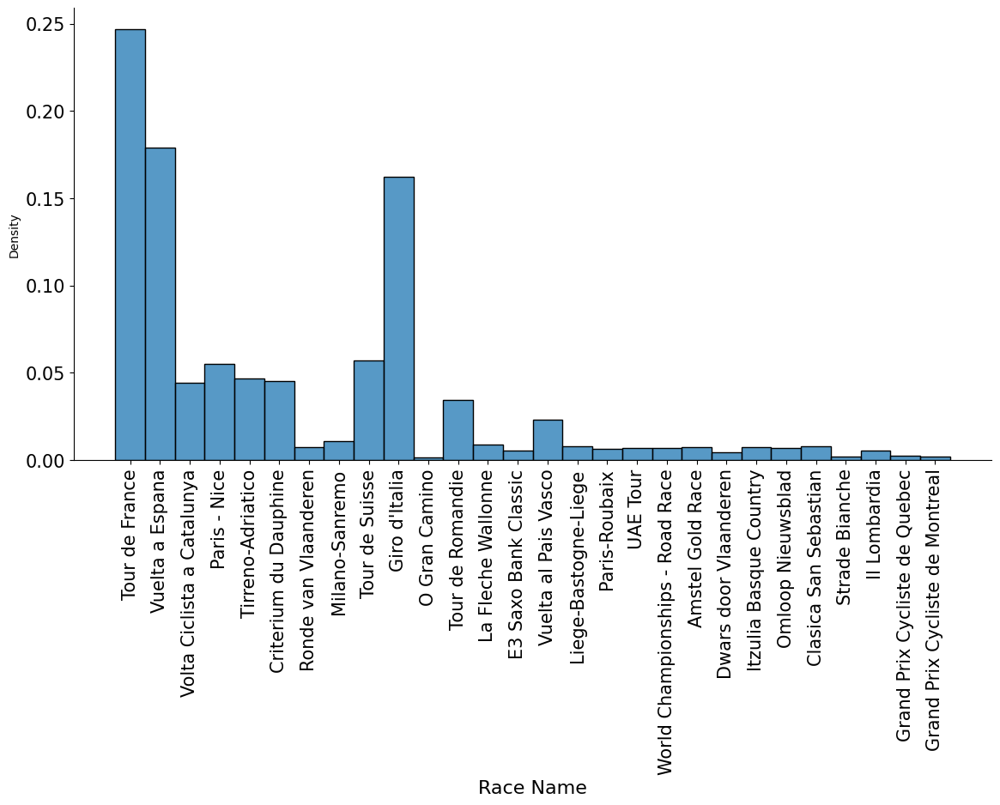

In [68]:
sb.displot(dataset, 
           x="name", 
           kind="hist",
           row_order="desc",
           bins=len(dataset['name'].unique()),
           stat='density',
           height=6,
           aspect=2) 
plt.xlabel("Race Name", fontsize=16);
plt.xticks(rotation=90);
plt.xticks(fontsize=15);
plt.yticks(fontsize=15);
plt.show()

In the above chart, we analyze the "race participation" according to the data in our dataset. To obtain this value, the bar chart shows the frequency in terms of records contained in the dataset for each different competition, ensuring that we do not count the participation of each cyclist in each stage of the same competition in the frequency calculation (each cyclist is counted only once for each competition-year pair). Since the records do not represent races but rather cyclists within a race, this evaluation allows us to extract the aforementioned information.

By studying this distribution, it is possible to notice that some competitions like O Gran Camino, UAE Tour, and Itzulia Basque Country are less represented in our dataset in terms of participation (participation <= 1%).

In [70]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'year': years
}).drop_duplicates()

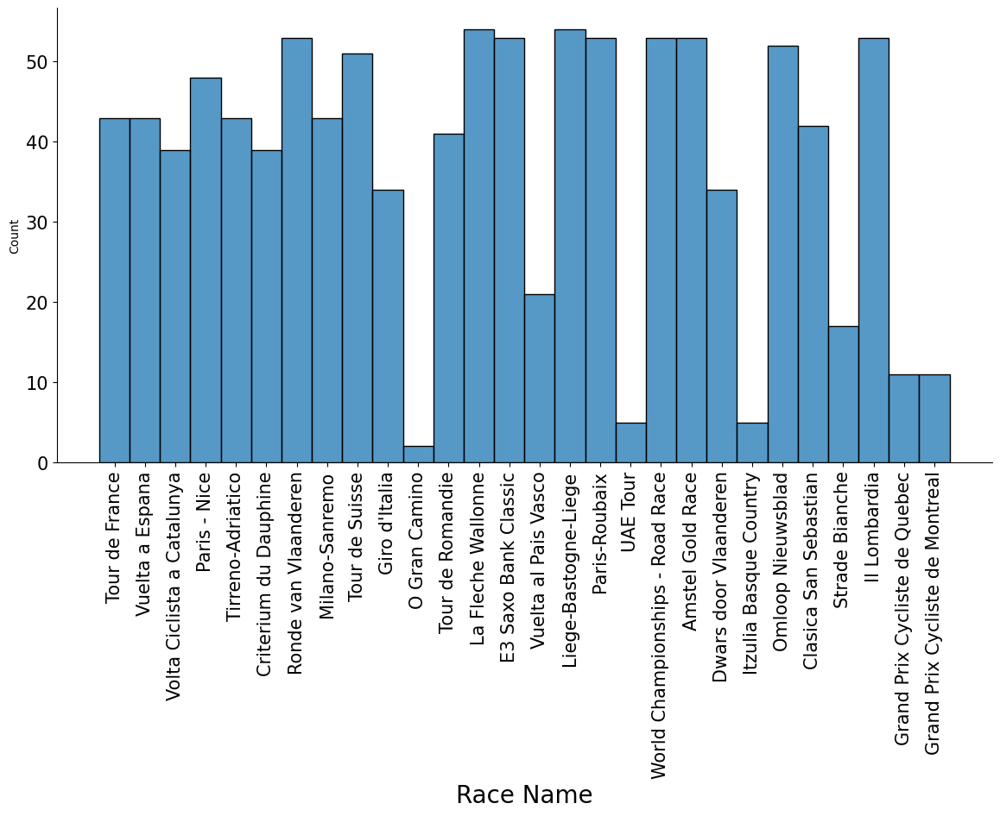

In [71]:
sb.displot(tmp_df, 
                x="race_name", 
                kind="hist",
                row_order="desc",
                bins=len(dataset['name'].unique()),
                height=6,
                aspect=2) 
plt.xlabel("Race Name", fontsize=20)
plt.xticks(rotation=90);
plt.xticks(rotation=90);
plt.xticks(fontsize=15);
plt.yticks(fontsize=15);

The plot above shows the number of editions of each race found in the dataset. We can see that the "less participated" races (O Gran Camino, UAE Tour, Itzulia Basque Country) are actually races for which we simply have few records in our dataset, even in terms of the number of registered editions.

<Axes: xlabel='Mean number of stages', ylabel='name'>

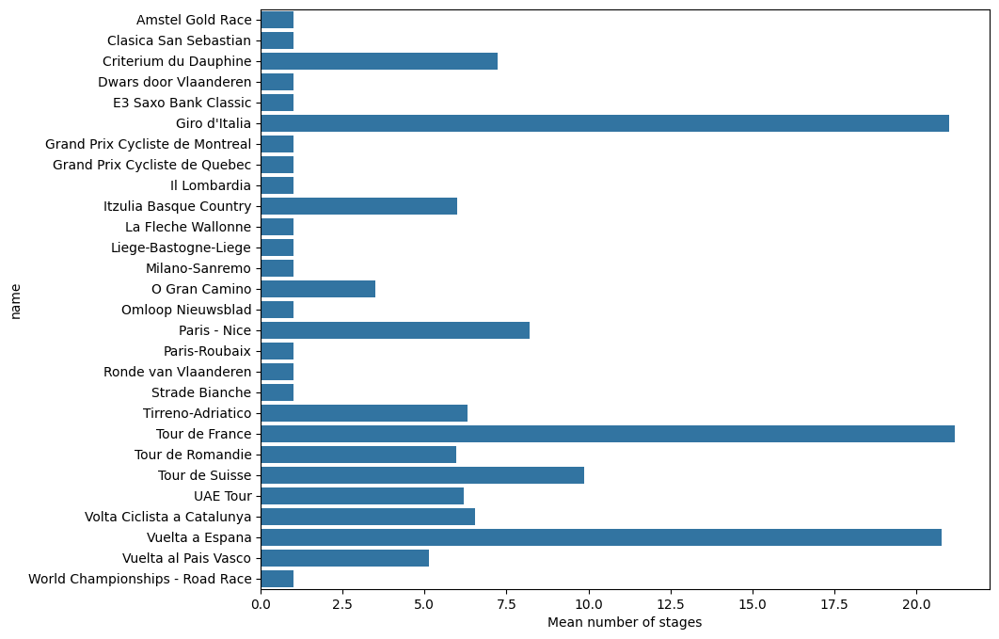

In [68]:
n_years_per_race = tmp_df.groupby('race_name')['year'].nunique()

sum_race_url_per_years = dataset.groupby('name')['_url'].nunique()

mean_race_url = sum_race_url_per_years / n_years_per_race

mean_race_df = mean_race_url.reset_index()

plt.figure(figsize=(10, 8))
plt.xlabel('Mean number of stages')
sb.barplot(y='name', x=0, data=mean_race_df, orient='h')

The chart above represents the average number of stages over the years for each competition in our dataset. We can observe that the fact that one race is more or less participated than another does not seem to determine the number of stages (at least from a qualitative analysis). An example of this behavior emerges from the comparison of the competition "O Gran Camino" with the competition "Milano-Sanremo," the first being one of the lowest in terms of participation and the second one of the most participated, yet the latter results in fewer stages (1 stage compared to 3/4 depending on the year).

The chart also shows that the majority (15 out of 28) of the competitions have only one stage (at least according to what is recorded in our dataset).

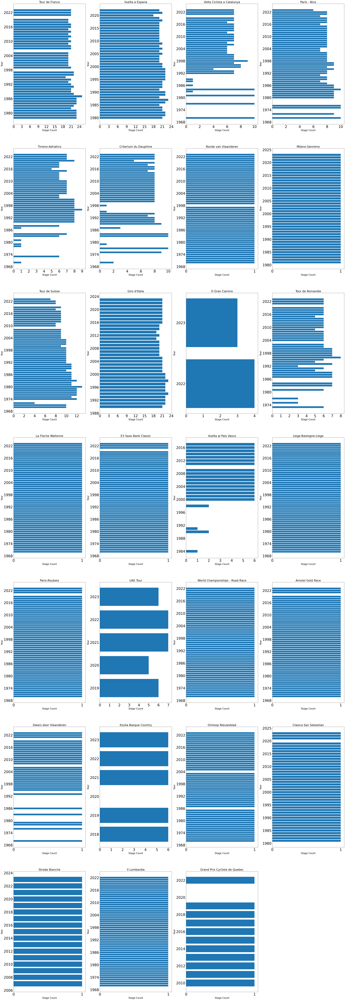

In [69]:
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'race_name': dataset['name'],
    'year': years, 
}).drop_duplicates()

stage_per_year = tmp_df.groupby(['race_name', 'year'])['stage'].count().reset_index()

n_rows, n_cols = 7, 4
races = tmp_df['race_name'].unique()

plt.rcParams.update({'font.size': 20})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(50, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = stage_per_year[stage_per_year['race_name'] == race]
            axs[i, j].xaxis.set_major_locator(MaxNLocator(integer=True))
            axs[i, j].yaxis.set_major_locator(MaxNLocator(integer=True))
            axs[i, j].barh(race_data['year'], race_data['stage'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Year')
            axs[i, j].set_xlabel('Stage Count')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

### `points` attribute

<Axes: xlabel='points', ylabel='race_name'>

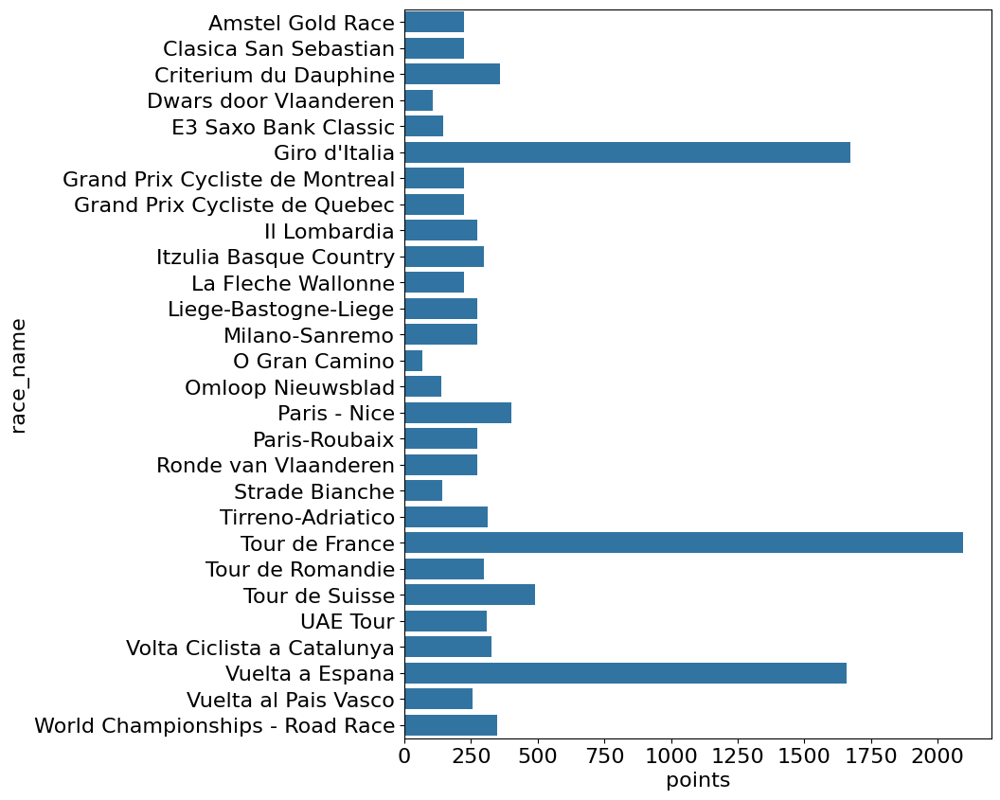

In [70]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'race_url': dataset['_url'],
    'year': years,
    'points': dataset['points']
}).drop_duplicates()

plt.rcParams.update({'font.size': 16})

tmp_sum = tmp_df.groupby(['year', 'race_name'])['points'].sum().reset_index()

tmp_mean = tmp_sum.groupby('race_name')['points'].mean().reset_index()

plt.figure(figsize=(8, 10))
sb.barplot(y='race_name', x='points', data=tmp_mean, orient='h')

The plot above shows the average (over the years) of the "points" attribute for the different races. We can see that although most races settle on the same average range of scores, some of them (Giro d'Italia, Tour de France, and Vuelta a Espana in particular) offer significantly higher average scores. Interestingly, a similar trend emerges from the startlist quality attribute for the same competitions.

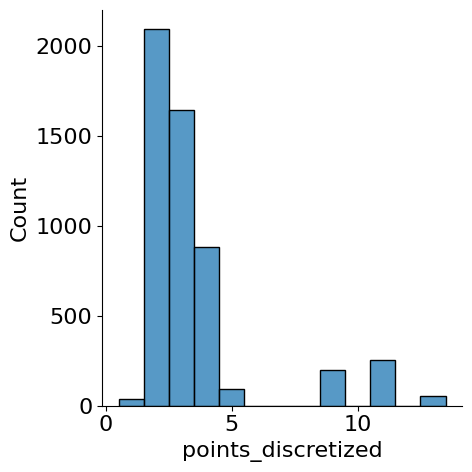

In [71]:
N = len(tmp_df[tmp_df['points'].notnull()])
bins = int(1 + 10/3 * math.log10(N))

tmp_df['points_discretized'] = pd.cut(tmp_df['points'], bins=bins, labels=[i for i in range(1, bins+1)])

sb.displot(tmp_df, 
                x="points_discretized", 
                kind="hist",
                row_order="desc",
                bins=len(tmp_df['points_discretized'].unique()))

The chart above shows the distribution of 8 ranges of values of the "points" attribute within our dataset.

In [72]:
tmp_df['points_discretized'].value_counts(normalize=True).sort_index()

points_discretized
1     0.007580
2     0.397574
3     0.312488
4     0.167898
5     0.017624
6     0.000190
7     0.000000
8     0.000000
9     0.038090
10    0.000000
11    0.048512
12    0.000000
13    0.010044
Name: proportion, dtype: float64

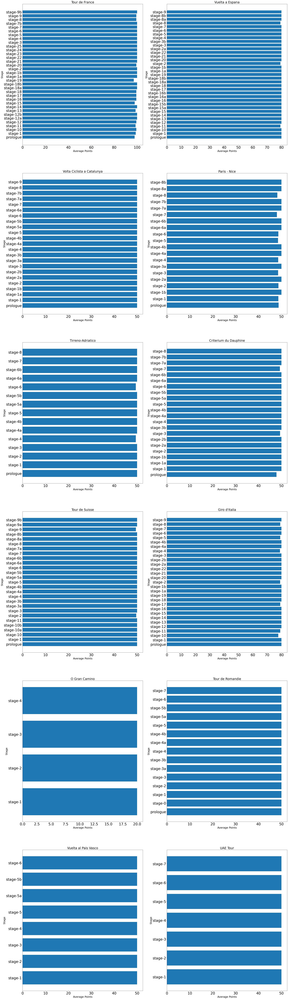

In [73]:
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'race_name': dataset['name'],
    'year': years,
    'length': dataset['length'],
    'points': dataset['points'],  
}).drop_duplicates()

avg_points = tmp_df.groupby(['race_name', 'stage'])['points'].mean().reset_index()

n_rows, n_cols = 6, 2
multi_stage_races = tmp_df.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_points[avg_points['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['points'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Average Points')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

### `uci_points` attribute

<Axes: xlabel='uci_points', ylabel='race_name'>

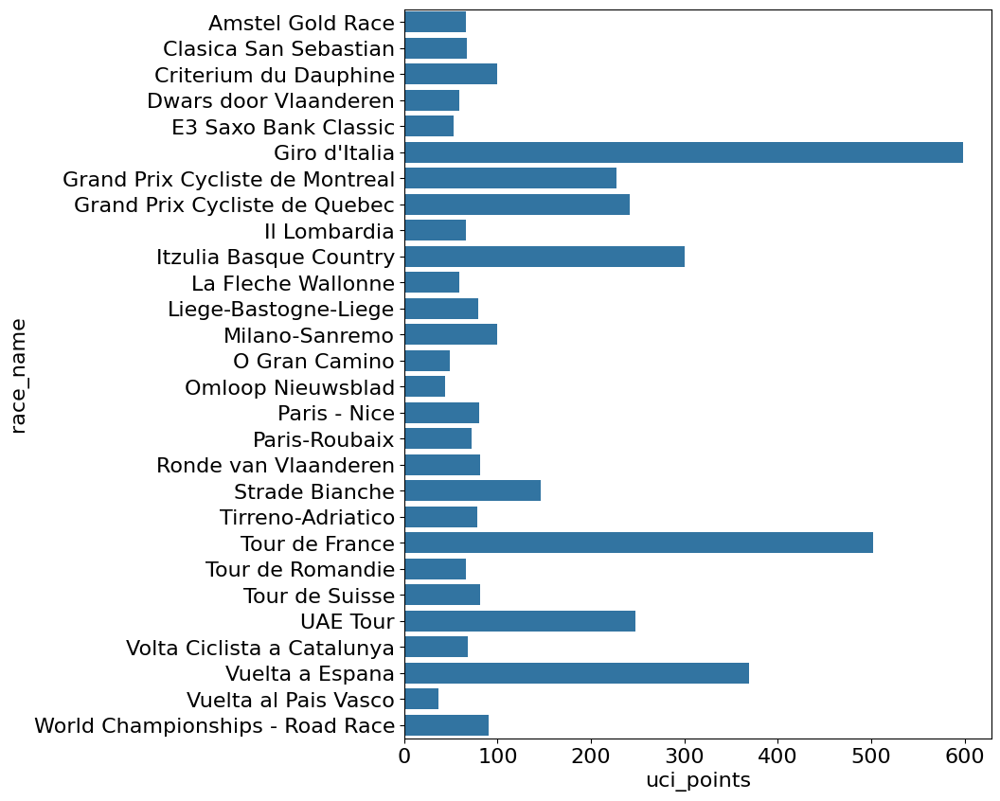

In [74]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'race_url': dataset['_url'],
    'year': years,
    'uci_points': dataset['uci_points']
}).drop_duplicates()

plt.rcParams.update({'font.size': 16})

tmp_sum = tmp_df.groupby(['year', 'race_name'])['uci_points'].sum().reset_index()

tmp_mean = tmp_sum.groupby('race_name')['uci_points'].mean().reset_index()

plt.figure(figsize=(8, 10))
sb.barplot(y='race_name', x='uci_points', data=tmp_mean, orient='h')

The plot above shows the average (over the years) of the "uci_points" attribute for the different races. We can see that although most races settle on the same average range of scores, some of them (Giro d'Italia, Tour de France, and Vuelta a Espana in particular) offer significantly higher average scores. Interestingly, a similar trend emerges from the startlist quality attribute for the same competitions.

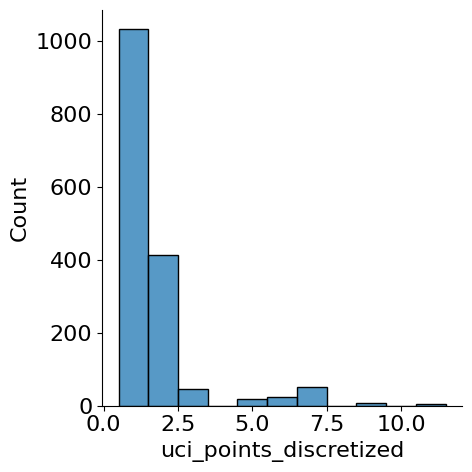

In [75]:
N = len(tmp_df[tmp_df['uci_points'].notnull()])
bins = int(1 + 10/3 * math.log10(N))

tmp_df['uci_points_discretized'] = pd.cut(tmp_df['uci_points'], bins=bins, labels=[i for i in range(1, bins+1)])

sb.displot(tmp_df, 
                x="uci_points_discretized", 
                kind="hist",
                row_order="desc",
                bins=len(tmp_df['uci_points_discretized'].unique()))

The chart above shows the distribution of 8 ranges of values of the "uci_points" attribute within our dataset.

In [76]:
tmp_df['uci_points_discretized'].value_counts(normalize=True).sort_index()

uci_points_discretized
1     0.646654
2     0.258912
3     0.028143
4     0.000000
5     0.011882
6     0.015009
7     0.031895
8     0.000000
9     0.005003
10    0.000000
11    0.002502
Name: proportion, dtype: float64

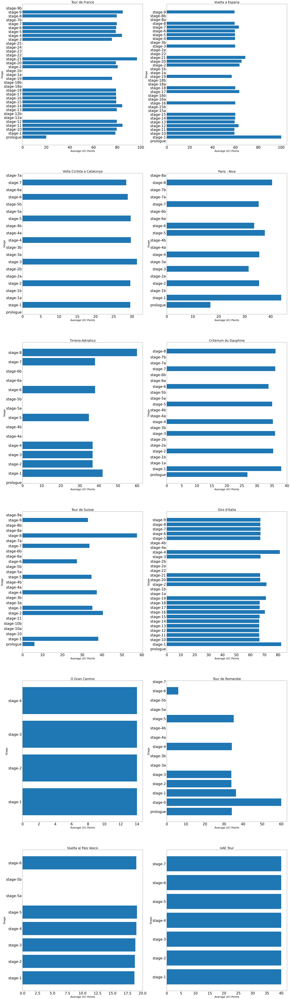

In [77]:
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'race_name': dataset['name'],
    'year': years,
    'length': dataset['length'],
    'uci_points': dataset['uci_points'],
    'position': dataset['position'] 
}).drop_duplicates()

avg_uci_points = tmp_df.groupby(['race_name', 'stage'])['uci_points'].mean().reset_index()

n_rows, n_cols = 6, 2

multi_stage_races = tmp_df.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_uci_points[avg_uci_points['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['uci_points'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Average UCI Points')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

In the above chart, we examine the average number of "UCI points" per year across the different stages of each race. It is noted that stage scores can vary within the same competition, but the differences are generally contained. Additionally, some stages have an average value of zero, which can be attributed to data gaps within our dataset. Considering that "UCI points" started being recorded from 2001, we will proceed to perform the same analysis limited to the years after 2001.

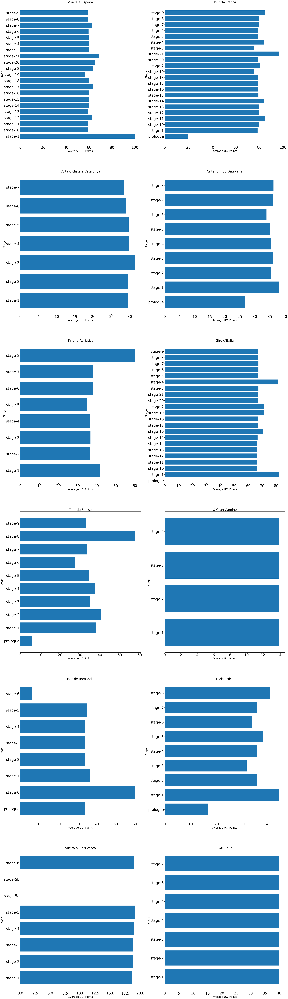

In [78]:
tmp_after_uci = tmp_df[tmp_df['year'] >= 2001]
avg_uci_points = tmp_after_uci.groupby(['race_name', 'stage'])['uci_points'].mean().reset_index()

multi_stage_races = tmp_after_uci.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_uci_points[avg_uci_points['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['uci_points'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Average UCI Points')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

In the above chart, we examine the average number of "UCI points" per year across the different stages of each race. It is noted that stage scores can vary within the same competition, but the differences are generally contained.

### `length` attribute

<Axes: xlabel='length', ylabel='race_name'>

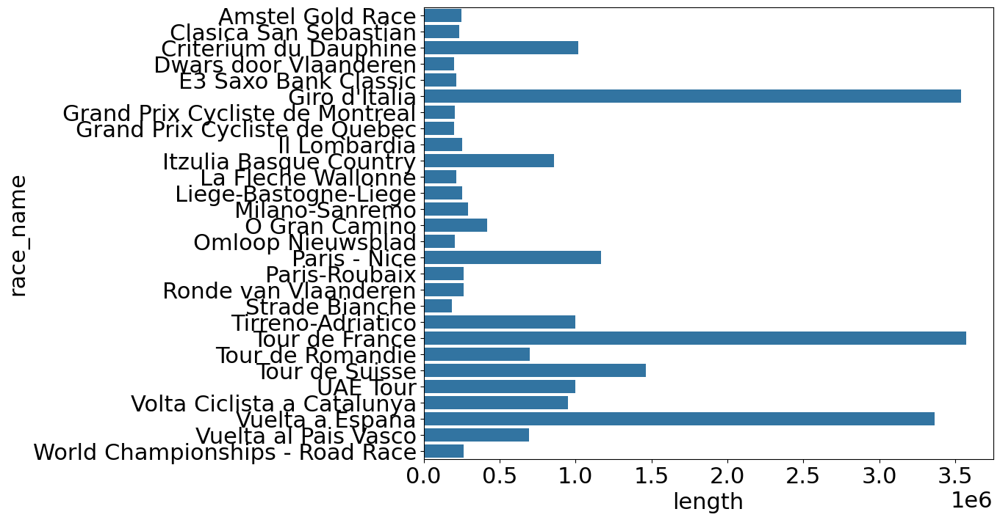

In [79]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'race_url': dataset['_url'],
    'year': years,
    'length': dataset['length']
}).drop_duplicates()

tmp_sum = tmp_df.groupby(['year', 'race_name'])['length'].sum().reset_index()

tmp_mean = tmp_sum.groupby('race_name')['length'].mean().reset_index()

plt.figure(figsize=(10, 8))
sb.barplot(y='race_name', x='length', data=tmp_mean, orient='h')

The plot above shows the average (over the years) lengths of each race in our dataset. We decided to verify these values online to confirm the accuracy of our analysis, and the research was successful.


From this graph, it emerges that the Giro d'Italia, Tour de France, and Vuelta a Espana are the longest races. Additionally, we want to highlight the similarity with the previously seen graph (average number of stages per race) as a greater total length of the entire course corresponds to a greater (apparently proportional) number of stages into which the same course is divided. We will investigate this relationship further from a statistical point of view.

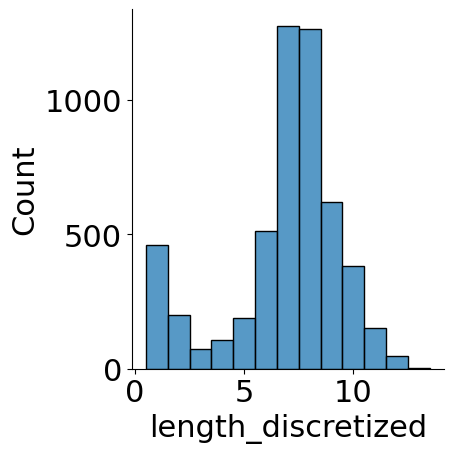

In [80]:
N = len(tmp_df[tmp_df['length'].notnull()])
bins = int(1 + 10/3 * math.log10(N))

tmp_df['length_discretized'] = pd.cut(tmp_df['length'], bins=bins, labels=[i for i in range(1, bins+1)])

sb.displot(tmp_df, 
                x="length_discretized", 
                kind="hist",
                row_order="desc",
                bins=len(tmp_df['length_discretized'].unique()))

The chart above shows the distribution of 13 ranges of values of the "length" attribute within our dataset.

In [81]:
tmp_df['length_discretized'].value_counts(normalize=True).sort_index()

length_discretized
1     0.087105
2     0.037682
3     0.014012
4     0.020261
5     0.035978
6     0.096762
7     0.241242
8     0.239538
9     0.117402
10    0.072145
11    0.028593
12    0.008900
13    0.000379
Name: proportion, dtype: float64

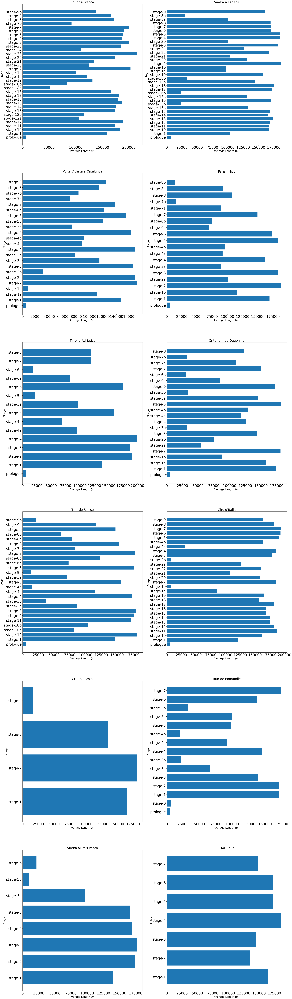

In [226]:
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'race_name': dataset['name'],
    'year': years,
    'length': dataset['length'],
    'climb_total': dataset['climb_total'],  
}).drop_duplicates()

avg_lengths = tmp_df.groupby(['race_name', 'stage'])['length'].mean().reset_index()

n_rows, n_cols = 6, 2
multi_stage_races = tmp_df.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_lengths[avg_lengths['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['length'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Average Length (m)')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

In the above chart, we study the average length (over the years) of the various stages of each race. We can notice that the stages can have variable lengths within the same competition, and consequently, it is possible to assume that the division into stages of a course is not determined solely by the length of each stage, but also by other factors such as: characteristics of the stage (type of terrain, type of environment, slope ...) or more "political" characteristics of the regions involved in the course (for example, the stages of the Giro d'Italia, which depend on the various cities and regions where the stages take place).

In [83]:
avg_lengths[avg_lengths['race_name'] == 'Criterium du Dauphine']

,race_name,stage,length
2,Criterium du Dauphine,prologue,5158.333333
3,Criterium du Dauphine,stage-1,173293.750000
4,Criterium du Dauphine,stage-1a,157500.000000
5,Criterium du Dauphine,stage-1b,88000.000000
6,Criterium du Dauphine,stage-2,181009.090909
7,Criterium du Dauphine,stage-2a,54000.000000
8,Criterium du Dauphine,stage-2b,75000.000000
9,Criterium du Dauphine,stage-3,143471.875000
10,Criterium du Dauphine,stage-3b,32000.000000
11,Criterium du Dauphine,stage-4,125928.125000


### `climb_total` attribute

<Axes: xlabel='climb_total', ylabel='race_name'>

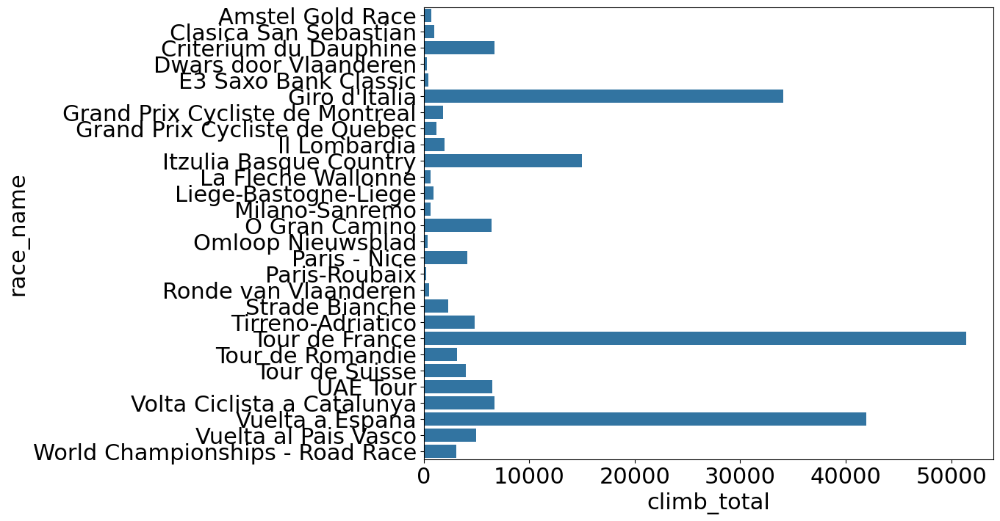

In [84]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'race_url': dataset['_url'],
    'year': years,
    'climb_total': dataset['climb_total']
}).drop_duplicates()

tmp_sum = tmp_df.groupby(['year', 'race_name'])['climb_total'].sum().reset_index()

tmp_mean = tmp_sum.groupby('race_name')['climb_total'].mean().reset_index()

plt.figure(figsize=(10, 8))
sb.barplot(y='race_name', x='climb_total', data=tmp_mean, orient='h')

The plot above studies the variation of the average "climb_total" attribute for each race. We can notice that there is no uniformity in the slope of the course of a race, nor is there an internationally respected standard. We can therefore hypothesize that each competition has geophysical characteristics simply determined by the chosen location for the competition, without this choice being linked to the search for specific characteristics.

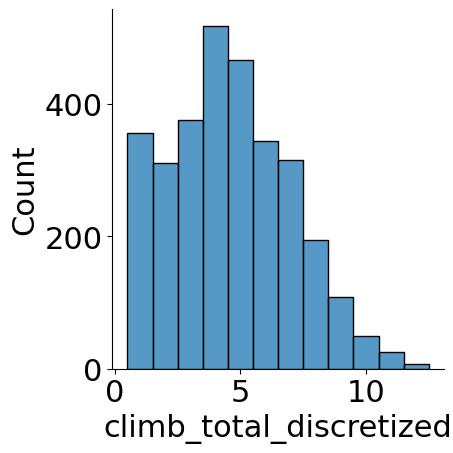

In [85]:
N = len(tmp_df[tmp_df['climb_total'].notnull()])
bins = int(1 + 10/3 * math.log10(N))

tmp_df['climb_total_discretized'] = pd.cut(tmp_df['climb_total'], bins=bins, labels=[i for i in range(1, bins+1)])

sb.displot(tmp_df, 
                x="climb_total_discretized", 
                kind="hist",
                row_order="desc",
                bins=len(tmp_df['climb_total_discretized'].unique()))

The chart above shows the distribution of 12 ranges of values of the "climb_total" attribute within our dataset.

In [86]:
tmp_df['climb_total_discretized'].value_counts(normalize=True).sort_index()

climb_total_discretized
1     0.116074
2     0.101076
3     0.122269
4     0.168569
5     0.151940
6     0.112162
7     0.102706
8     0.063580
9     0.035214
10    0.015977
11    0.008151
12    0.002282
Name: proportion, dtype: float64

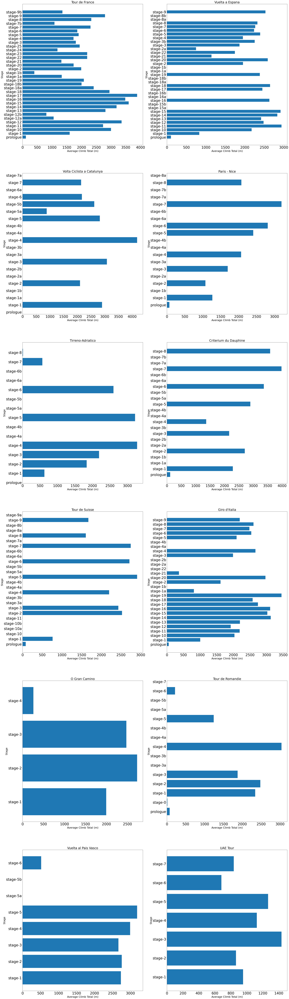

In [87]:
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'race_name': dataset['name'],
    'year': years,
    'length': dataset['length'],
    'climb_total': dataset['climb_total'],  
}).drop_duplicates()

avg_climb_total = tmp_df.groupby(['race_name', 'stage'])['climb_total'].mean().reset_index()

n_rows, n_cols = 6, 2
multi_stage_races = tmp_df.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_climb_total[avg_climb_total['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['climb_total'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Average Climb Total (m)')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

In the above chart, we study the average slope (attribute "climb_total") of the various stages of each race over the years. We can notice that the stages can have variable slopes within the same competition, and consequently, it is possible to assume that the division into stages of a course is not determined solely by the slope of each stage, but also by other factors such as: characteristics of the stage (type of terrain, type of environment, etc.) or more "political" characteristics of the regions involved in the course (for example, the stages of the Giro d'Italia, which depend on the various cities and regions where the stages take place).

### `profile` attribute

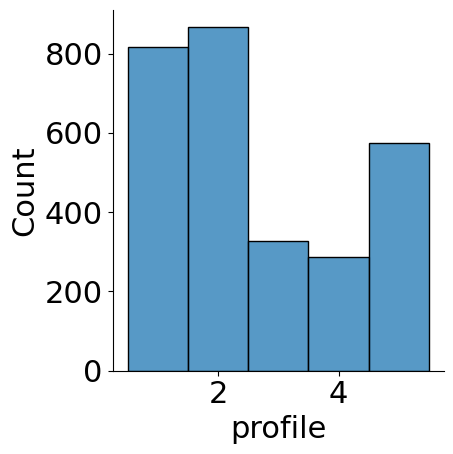

In [88]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'stage': dataset['_url'].str.split('/').str[-1],
    'year': years,
    'profile': dataset['profile'] 
}).drop_duplicates().dropna()

sb.displot(tmp_df, 
                x="profile", 
                kind="hist",
                row_order="desc",
                bins=len(tmp_df['profile'].unique()))

The chart above shows the distribution of the 5 values of the "profile" attribute within our dataset.

In [89]:
tmp_df['profile'].value_counts(normalize=True).sort_index()

profile
1.0    0.284372
2.0    0.301775
3.0    0.113818
4.0    0.099896
5.0    0.200139
Name: proportion, dtype: float64

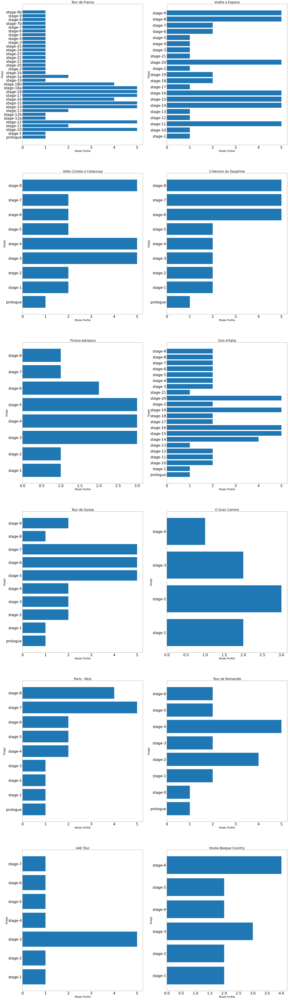

In [90]:
avg_profile = tmp_df.groupby(['race_name', 'stage'])['profile'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None).reset_index()

n_rows, n_cols = 6, 2
multi_stage_races = tmp_df.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_profile[avg_profile['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['profile'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Mode Profile')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

In the above chart, we study the variation of the mode of the "profile" attribute over the years for the various stages of each race. We can notice that the stages can have variable profiles within the same competition, and consequently, it is possible to assume that the division into stages of a course is not determined solely by the profile of each stage, but also by other factors such as: characteristics of the stage (type of terrain, type of environment, etc.) or more "political" characteristics of the regions involved in the course (for example, the stages of the Giro d'Italia, which depend on the various cities and regions where the stages take place).

### `startlist_quality` attribute

<Axes: xlabel='startlist_quality', ylabel='race_name'>

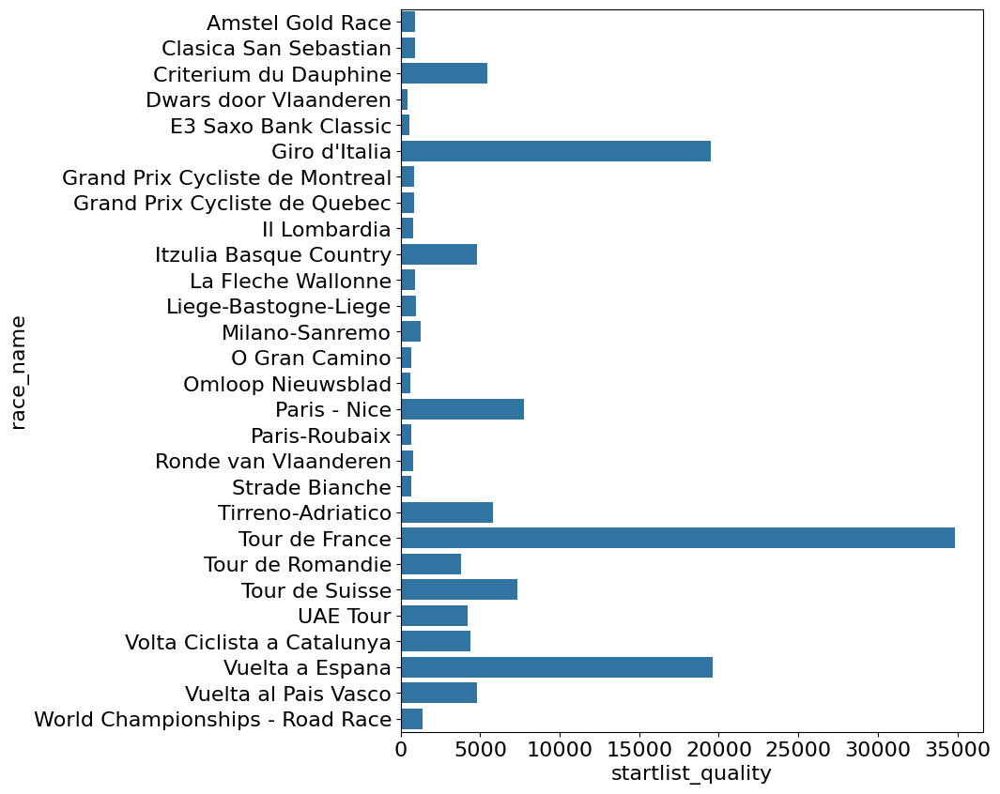

In [92]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'race_url': dataset['_url'],
    'year': years,
    'startlist_quality': dataset['startlist_quality']
}).drop_duplicates()

plt.rcParams.update({'font.size': 16})

tmp_sum = tmp_df.groupby(['year', 'race_name'])['startlist_quality'].sum().reset_index()

tmp_mean = tmp_sum.groupby('race_name')['startlist_quality'].mean().reset_index() 

plt.figure(figsize=(8, 10))
sb.barplot(y='race_name', x='startlist_quality', data=tmp_mean, orient='h')

The plot above shows the average (over the years) of the "startlist_quality" attribute for the different races. We can see that there is no uniformity in the startlist quality of the competitions present in our dataset, and that different competitions have particularly different average values. The fact that one competition has a higher average value of this attribute compared to another could be synonymous with the prestige of the former, motivated by the fact that the quality of the startlist is generally better than the latter.

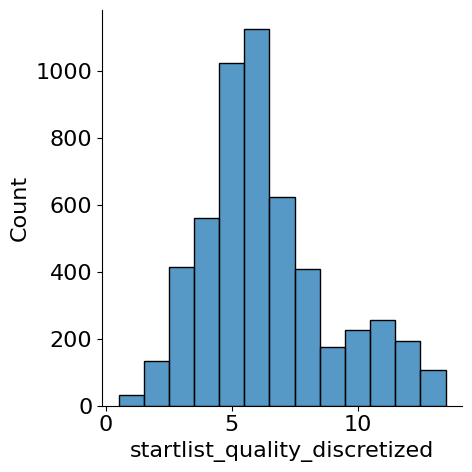

In [93]:
N = len(tmp_df[tmp_df['startlist_quality'].notnull()])
bins = int(1 + 10/3 * math.log10(N))

tmp_df['startlist_quality_discretized'] = pd.cut(tmp_df['startlist_quality'], bins=bins, labels=[i for i in range(1, bins+1)])

sb.displot(tmp_df, 
                x="startlist_quality_discretized", 
                kind="hist",
                row_order="desc",
                bins=len(tmp_df['startlist_quality_discretized'].unique()))

The chart above shows the distribution of 13 ranges of values of the "startlist_quality" attribute within our dataset.

In [94]:
tmp_df['startlist_quality_discretized'].value_counts(normalize=True).sort_index()

startlist_quality_discretized
1     0.005870
2     0.025185
3     0.078584
4     0.106419
5     0.194092
6     0.213217
7     0.118349
8     0.077069
9     0.032948
10    0.042606
11    0.048665
12    0.036546
13    0.020451
Name: proportion, dtype: float64

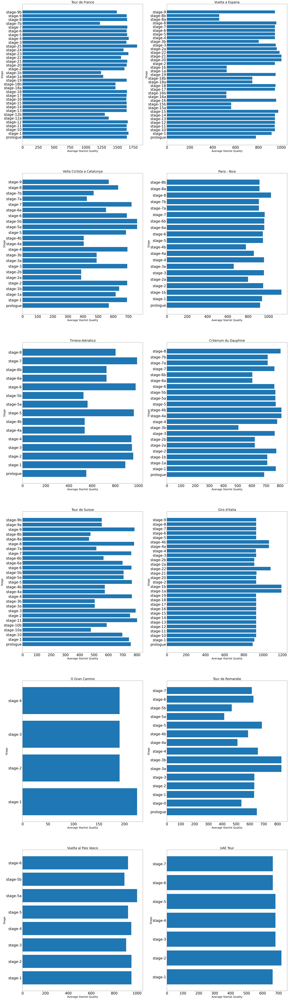

In [95]:
tmp_df = pd.DataFrame({
    'stage': dataset['_url'].str.split('/').str[-1],
    'race_name': dataset['name'],
    'year': years,
    'length': dataset['length'],
    'startlist_quality': dataset['startlist_quality'],  
}).drop_duplicates()

avg_climb_total = tmp_df.groupby(['race_name', 'stage'])['startlist_quality'].mean().reset_index()

n_rows, n_cols = 6, 2
multi_stage_races = tmp_df.groupby('race_name').filter(lambda x: x['stage'].nunique() > 1)
races = multi_stage_races['race_name'].unique()

plt.rcParams.update({'font.size': 22})
fig, axs = plt.subplots(n_rows, n_cols, figsize=(40, 150))

for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        if index < len(races)-1:
            race = races[i * n_cols + j]
            race_data = avg_climb_total[avg_climb_total['race_name'] == race]
            axs[i, j].barh(race_data['stage'], race_data['startlist_quality'])
            axs[i, j].set_title(race)
            axs[i, j].set_ylabel('Stage')
            axs[i, j].set_xlabel('Average Starlist Quality')
            axs[i, j].tick_params(axis='both', which='major', labelsize=30)
        else:
            axs[i, j].axis('off')

In the above chart, we study the variation of the average "startlist-quality" attribute over the years for the various stages of each race. We can notice that the stages can have variable values of the attribute even within the same competition. This characteristic could be due to a variation in the cyclists participating stage after stage (rotations within the same team for different stages, disqualifications, injuries, etc.). It is also important to highlight that the variation of the attribute is not excessively intense, confirming that the prestige quality of a given race is generally and relatively constant.

### `date` attribute

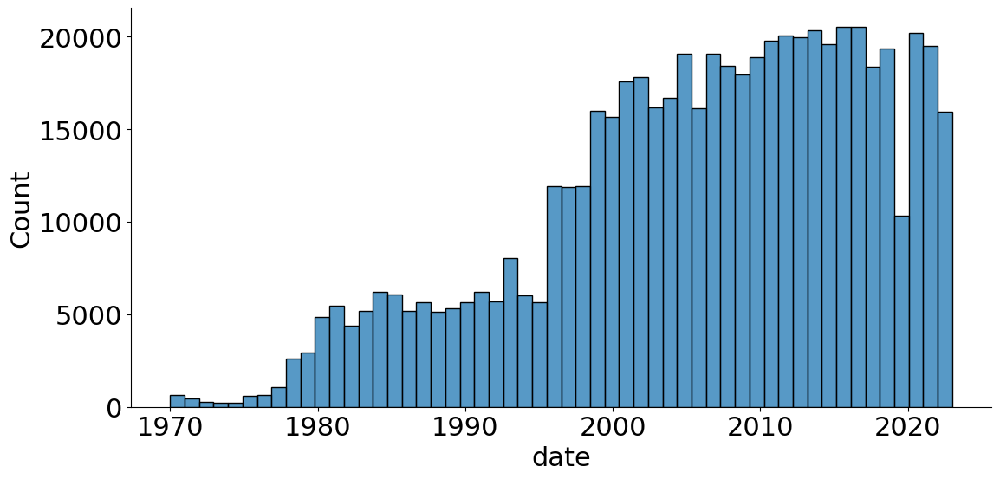

In [96]:
sb.displot(dataset, 
                x=years, 
                kind="hist",
                row_order="desc",
                bins=len(years.unique()),
                height=6,
                aspect=2)

Analyzing the distribution of the years to which the contents of the various records in the "races.csv" dataset date back, it emerges that the most present data are those after around 1995. This could be due to the fact that cycling may have established itself as a sport (with a significant increase in importance) only after this date  or because the source of these data became a relevant information repository only from that era.

Another relevant characteristic concerns the representation of the class of dates adjacent to 2020, a year in which we see a clear absence of information compared to the surrounding years. The explanation for this phenomenon is likely to be found in the Covid-19 pandemic, which during that historical period drastically limited the possibility of starting and participating in public and sporting events such as cycling races.

### `position` attribute

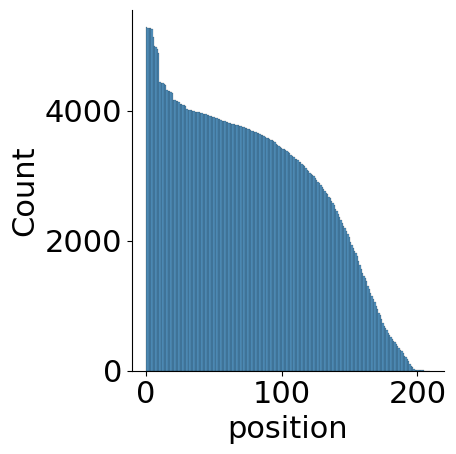

In [97]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'year': dataset['date'].dt.year,
    'position': dataset['position']
})

sb.displot(tmp_df, 
                x="position", 
                kind="hist",
                row_order="desc",
                bins=len(dataset['position'].unique()))

The chart shows the distribution of position values within our dataset. The most frequent positions are in the range from 0 to 100, while those above 100 tend to have lower frequencies. This is probably due to the fact that few races are particularly important, which results in average in a lower number of participations.

<Axes: xlabel='Mean number of positions', ylabel='race_name'>

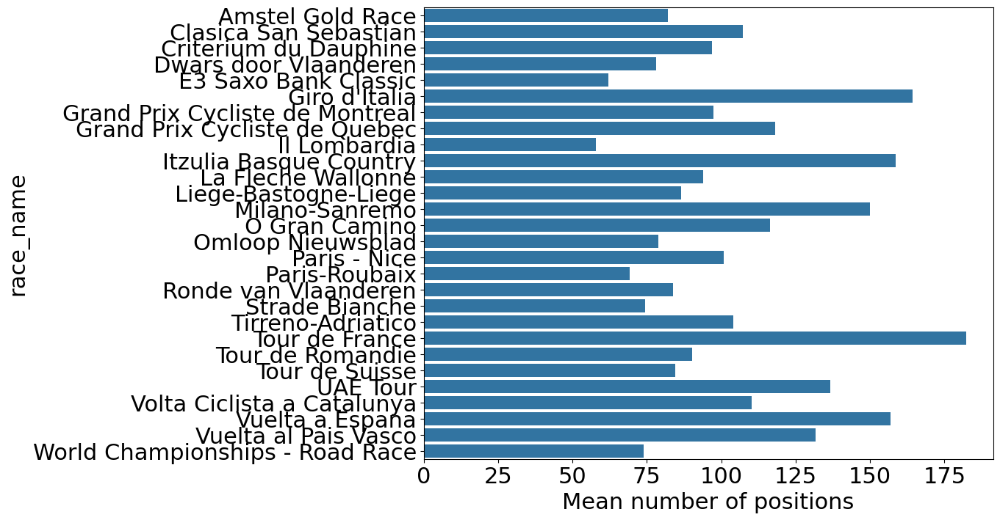

In [98]:
sum_positions_per_race = df = tmp_df.groupby(['race_name', 'year'])['position'].nunique().reset_index()
mean_positions_per_race = df.groupby('race_name')['position'].mean().reset_index()

plt.figure(figsize=(10, 8))
plt.xlabel('Mean number of positions')
sb.barplot(y='race_name', x='position', data=mean_positions_per_race, orient='h')

The chart represents the average number of positions recorded for each competition. As expected, the most important races show a higher number of positions in the ranking, probably due to the higher number of participants.

### `delta` attribute

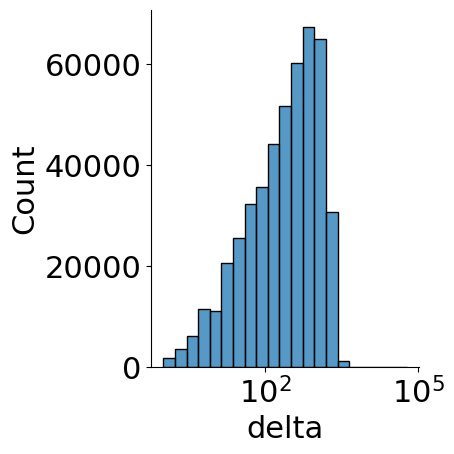

In [99]:
tmp_df['delta'] = dataset['delta']
N = len(tmp_df[tmp_df['delta'].notnull()])
bins = math.ceil(math.log2(N) + 1)

sb.displot(tmp_df, 
                x="delta", 
                kind="hist",
                row_order="desc",
                bins=bins,
                log_scale=True)

### `cyclist_age` attribute

29


<Figure size 2000x2000 with 0 Axes>

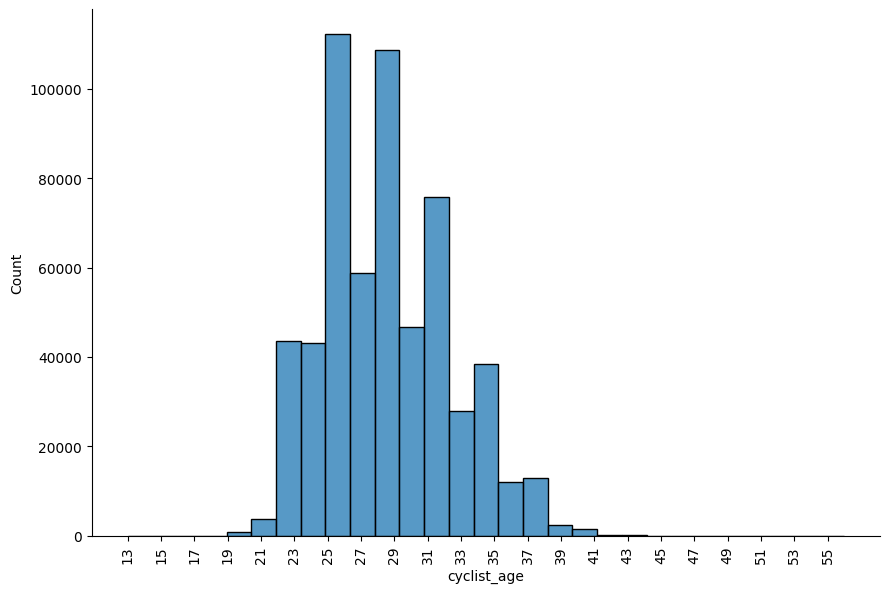

In [25]:
tmp_df = pd.DataFrame({
    'race_name': dataset['name'],
    'year': dataset['date'].dt.year,
    'cyclist_age': dataset['cyclist_age']
})

plt.figure(figsize=(20, 20))
print(tmp_df['cyclist_age'].nunique())
sb.displot(tmp_df, 
                x="cyclist_age", 
                kind="hist",
                row_order="desc",
                bins=tmp_df['cyclist_age'].nunique(), 
                height=6, 
                aspect=1.5)

plt.xticks(range(int(tmp_df['cyclist_age'].min()), int(tmp_df['cyclist_age'].max()) + 1, 2));
plt.xticks(rotation=90);


## Feature Correlations

In [102]:
dataset = pd.read_csv("../data/races.csv")

normalized_dataset_races, normalization_scalers_races = center_and_scale(dataset)
correlation = correlations(normalized_dataset_races)
correlation

,points,uci_points,length,climb_total,profile,startlist_quality,average_temperature,position,cyclist_age,delta,correlation_type
points,1.000000,0.486830,0.283637,0.044915,-0.097831,0.387373,0.153829,0.011531,-0.005476,0.068592,kendall
uci_points,0.486830,1.000000,0.098587,0.046858,-0.000465,0.007000,0.066502,-0.023719,0.007526,0.070373,kendall
length,0.283637,0.098587,1.000000,0.285099,0.017441,0.064082,-0.095313,-0.015373,-0.002381,0.029217,kendall
climb_total,0.044915,0.046858,0.285099,1.000000,0.578126,0.009066,-0.079710,-0.023858,0.005533,0.356194,kendall
profile,-0.097831,-0.000465,0.017441,0.578126,1.000000,-0.092412,-0.020977,-0.018424,0.005635,0.420183,kendall
startlist_quality,0.387373,0.007000,0.064082,0.009066,-0.092412,1.000000,0.218390,0.097527,0.033589,0.032290,kendall
average_temperature,0.153829,0.066502,-0.095313,-0.079710,-0.020977,0.218390,1.000000,0.015593,0.033887,0.023630,kendall
position,0.011531,-0.023719,-0.015373,-0.023858,-0.018424,0.097527,0.015593,1.000000,0.006378,0.296542,kendall
cyclist_age,-0.005476,0.007526,-0.002381,0.005533,0.005635,0.033589,0.033887,0.006378,1.000000,-0.002685,kendall
delta,0.068592,0.070373,0.029217,0.356194,0.420183,0.032290,0.023630,0.296542,-0.002685,1.000000,kendall


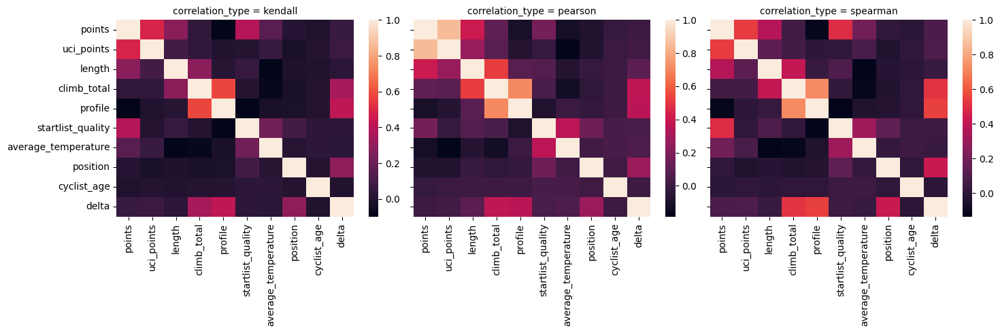

In [103]:
plt.rcParams.update({'font.size': 10})

g = sb.FacetGrid(correlation, col="correlation_type", height=5)
g.map_dataframe(lambda data, color: sb.heatmap(data[data.columns[:-1]]))

The table shows the correlation coefficients between the attributes `points`, `uci_points`, `length`, `climb_total`, `profile`, `startlist_quality`, `average_temperature`, `position`, `cyclist_age`, and `delta`. The correlations are calculated using three different methods:

- **Kendall**: A non-parametric measure assessing the strength and direction of the association between variables.
- **Pearson**: Measures the linear relationship between variables, assuming normally distributed data.
- **Spearman**: A non-parametric measure evaluating the monotonic relationship between variables.

Observing the charts, we notice a lack of significant correlations between the different characteristics analyzed. The few correlations detected include:
- **`climb_total` and `profile`**: these two parameters, related to the altimetric characteristics of the route, show a correlation suggesting that an increase in total elevation gain is often associated with a more challenging profile;
- **`points` and `uci_points`**: there is a strong correlation between the number of general points and the "UCI points," indicating that the points awarded in the race tend to reflect the UCI's scoring criteria.